## Approximately 30 minutes run all notebook

In [2]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import random
import networkx as nx
import nltk
import gdown
import timeit
import igraph as ig
import string
import itertools

from scipy.optimize import curve_fit
from nltk.sentiment import SentimentIntensityAnalyzer
from math import log2
from copy import deepcopy
from collections import defaultdict
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import silhouette_score, adjusted_rand_score, normalized_mutual_info_score
from sklearn.cluster import KMeans
from joblib import Parallel, delayed
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image

# 1. Introduction

Today, social media platforms play a crucial role in expression of public opinion. They offer a open virtual space, where voices from all over the world multiply and confront each other. In conflictual contexts, these platforms easily become a place of polarized opinions and extreme language, moving away from natural respectful discussions.

In the scope of this project, we aim to explore such network dynamics by means of a dataset taken from Kaggle, containing over one million real posts published on Reddit about the Israeli-Palestinian war (https://www.kaggle.com/datasets/asaniczka/reddit-on-israel-palestine-daily-updated). It being a very sensitive subjet, our aim was not to form any personal opinions, but rather to analyze what the sentiment of the general public is towards this ongoing war.

By taking data like the posts and their associated comments, we try to understand and analyze the relationship between social support, expressed through "likes", and the intensity of the language used. To do this, we constructed a customized graph where the nodes represent the posts and the edges the relationship between them based on the associated sentiment. This graphical representation allows us to pursue community detection. Through the application of sentiment analysis techniques and community detection algorithms, we aim to shed light on the relationships between the emotional intensity of the language used and the social support received, offering insights into the modes of expression and online interaction in situations of conflict.

## 1.1 Data Loading

In [3]:
#1min 10s
url = "https://drive.google.com/uc?id=1Jct0NpMR9PDKaoCKfAAPl39wEih8stan"
output = "file.csv"
gdown.download(url, output, quiet=False)
df = pd.read_csv("file.csv")

df

,comment_id,score,self_text,subreddit,created_time,post_id,author_name,controversiality,ups,downs,...,user_link_karma,user_comment_karma,user_total_karma,post_score,post_self_text,post_title,post_upvote_ratio,post_thumbs_ups,post_total_awards_received,post_created_time
0,kukfn3r,1,She really is going to be remember as a evil p...,Palestine,2024-03-12 19:36:21,1bd4fue,rumagin,0,1,0,...,96.0,11743.0,11849.0,86,NaN,She's right. 10+ civilians are killed by Israe...,0.95,86,0,2024-03-12 18:23:22
1,kukflt1,1,Grow up. Nobody wants to play Simon Says with ...,PublicFreakout,2024-03-12 19:36:08,1bd3eru,roronoaSuge_nite,0,1,0,...,11.0,23116.0,23127.0,72,NaN,Two Metropolitan Police officers were found gu...,0.90,72,0,2024-03-12 17:43:30
2,kukfld1,1,If Trump wins. All told this war is pretty sma...,worldnews,2024-03-12 19:36:04,1bd42ve,forthelewds2,0,1,0,...,7045.0,6625.0,13796.0,29,NaN,Israel attack on Rafah likely to cause U.S. po...,0.68,29,0,2024-03-12 18:09:15
3,kukfkcg,1,Welcome to the “democratic world order” instal...,worldnews,2024-03-12 19:35:53,1bd1p9n,eggressive,0,1,0,...,533.0,9653.0,11581.0,320,NaN,Iraqi terrorists claim to target Israel's Ben-...,0.91,320,0,2024-03-12 16:36:41
4,kukfjcw,1,that is simply a blatant lie,IsraelPalestine,2024-03-12 19:35:44,1bd2kaz,nhasbun,0,1,0,...,11.0,72.0,83.0,13,So the title is my main question but I am goin...,What is Hamas currently doing?,0.94,13,0,2024-03-12 17:10:19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1002660,jyt47gw,64,Something similar happened in Sweden recently.,ActualPublicFreakouts,2023-09-02 13:57:37,1680ip7,RevolutionarySoil11,0,64,0,...,1155.0,15755.0,17768.0,597,NaN,Eritrean immigrants (illegals) fighting in the...,0.94,597,0,2023-09-02 11:52:49
1002661,jyt10so,214,They should leave the anger and hatred back wh...,ActualPublicFreakouts,2023-09-02 13:33:15,1680ip7,theXsquid,0,214,0,...,27189.0,77824.0,107585.0,597,NaN,Eritrean immigrants (illegals) fighting in the...,0.94,597,0,2023-09-02 11:52:49
1002662,jyszx3n,71,Something similar happened in Germany recently...,ActualPublicFreakouts,2023-09-02 13:24:53,1680ip7,P3ric,0,71,0,...,12875.0,4938.0,18955.0,597,NaN,Eritrean immigrants (illegals) fighting in the...,0.94,597,0,2023-09-02 11:52:49
1002663,jysrra4,120,Who are the yellow shirts? The referees?,ActualPublicFreakouts,2023-09-02 12:17:34,1680ip7,[deleted],0,120,0,...,0.0,0.0,0.0,597,NaN,Eritrean immigrants (illegals) fighting in the...,0.94,597,0,2023-09-02 11:52:49


# 2. Data Quality & Preprocessing

As previously mentioned, the selected dataset offers slightly over one million data points, with 24 variables (columns). It has a size of approximately 20000 MB. Our variables of interest for the graph constructions are:
-	the score, which represents the sum of likes and dislikes for each post and is associated with each comment and post,
-	the comments themselves with their specific IDs,
-	the corresponding post IDs,
-	and the subreddit for each post. In our case, these elements are essential for obtaining generalizable information.

In general, only 7 variables presented a significant number of missing values. We decided to leave out these columns entirely.
After analyzing and observing the correlation and distribution of the score with other variables, we finally decided to keep the following columns for our graph construction: score, sentiment score, comment ID, and post ID.

After analyzing and observing the correlation and distribution of the score with other variables we finally decided to keep the following columns for our graph construction: score, sentiment score, comment ID and post ID.

## 2.1 Preprocessing and Sentiment Score

After selecting the relevant columns, we removed duplicates and missing values from these columns to ensure data integrity. We then employed the _Sentiment Intensity Analyzer_ to calculate sentiment scores, enhancing efficiency by utilizing parallel processing. This approach significantly reduced the computational time from eight minutes to two and a half minutes by distributing tasks across all available CPU cores, thereby optimizing the analysis for quicker and more reliable outcomes.

In [4]:
nltk.download('vader_lexicon')
sia = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\kutir\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [5]:
def calculate_sentiment(text):

    if pd.isna(text):
        return None

    sentiment_score = sia.polarity_scores(text)

    return sentiment_score['compound']

In [6]:
def preprocessing(df):

    selected_columns = [
        'comment_id', 'post_id', 'post_title', 'post_created_time', 'score', 'subreddit', 'self_text'
    ]

    df = df[selected_columns]
    df = df.drop_duplicates()
    df = df.dropna()

    # Calculating the sentiment score in parallel - uses all available cores and increases the time from 8min to 2min 30s
    # It is an alternative to this -> df['sentiment_score'] = df['self_text'].apply(calculate_sentiment)
    #df['sentiment_score'] = df['self_text'].apply(calculate_sentiment)
    df['sentiment_score'] = Parallel(n_jobs=-1)(delayed(calculate_sentiment)(text) for text in df['self_text'])

    return df

In [7]:
#7m 55s without parallel, 2min 30s with parallel
df_selected_features = preprocessing(df)
df_selected_features

,comment_id,post_id,post_title,post_created_time,score,subreddit,self_text,sentiment_score
0,kukfn3r,1bd4fue,She's right. 10+ civilians are killed by Israe...,2024-03-12 18:23:22,1,Palestine,She really is going to be remember as a evil p...,-0.9632
1,kukflt1,1bd3eru,Two Metropolitan Police officers were found gu...,2024-03-12 17:43:30,1,PublicFreakout,Grow up. Nobody wants to play Simon Says with ...,0.3400
2,kukfld1,1bd42ve,Israel attack on Rafah likely to cause U.S. po...,2024-03-12 18:09:15,1,worldnews,If Trump wins. All told this war is pretty sma...,0.3127
3,kukfkcg,1bd1p9n,Iraqi terrorists claim to target Israel's Ben-...,2024-03-12 16:36:41,1,worldnews,Welcome to the “democratic world order” instal...,-0.1531
4,kukfjcw,1bd2kaz,What is Hamas currently doing?,2024-03-12 17:10:19,1,IsraelPalestine,that is simply a blatant lie,0.0000
...,...,...,...,...,...,...,...,...
1002660,jyt47gw,1680ip7,Eritrean immigrants (illegals) fighting in the...,2023-09-02 11:52:49,64,ActualPublicFreakouts,Something similar happened in Sweden recently.,0.0000
1002661,jyt10so,1680ip7,Eritrean immigrants (illegals) fighting in the...,2023-09-02 11:52:49,214,ActualPublicFreakouts,They should leave the anger and hatred back wh...,-0.8442
1002662,jyszx3n,1680ip7,Eritrean immigrants (illegals) fighting in the...,2023-09-02 11:52:49,71,ActualPublicFreakouts,Something similar happened in Germany recently...,0.0000
1002663,jysrra4,1680ip7,Eritrean immigrants (illegals) fighting in the...,2023-09-02 11:52:49,120,ActualPublicFreakouts,Who are the yellow shirts? The referees?,0.0000


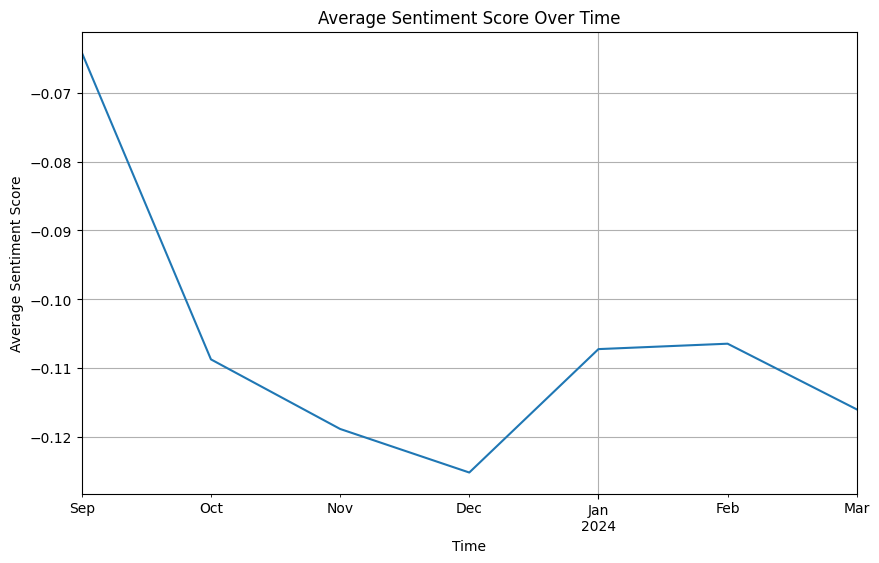

In [8]:
df_selected_features['post_created_time'] = pd.to_datetime(df_selected_features['post_created_time'])

df_selected_features.set_index('post_created_time', inplace=True)

monthly_sentiment = df_selected_features['sentiment_score'].resample('M').mean()

plt.figure(figsize=(10, 6))
monthly_sentiment.plot(title='Average Sentiment Score Over Time')
plt.xlabel('Time')
plt.ylabel('Average Sentiment Score')
plt.grid(True)
plt.show()

## 2.2 Creating Weighted Edge List

We decided to store the data as weighted_edge_list instead of a matrix. Using the edge list is a lot more efficient. Instead of the (19000, 19000) * 8B ~ 2.8GB memory needed to store it in the matrix, we use 500 000(edges) * 3*8B(size) ~ 12MB of memory.

|  | Edge list | Adjacency Matrix |
| --- | --- | --- |
| Memory | 12MB | 2.8GB | 

To develop the weighted edge list used for our network analysis, we first grouped the dataset by post_id. We then computed the mean sentiment_score and the mean score for each grouped post. Following this aggregation, we sorted the posts by sentiment_score from -1 to 1, facilitating the application of our sliding window technique to generate the weighted edge list effectively. This method streamlined our process, ensuring a more structured and focused approach to network construction.

In the sliding window technique, we establish a threshold to determine the range within which nodes can be connected based on their sentiment scores. For instance, if a node has a sentiment score of 0.5000 and we set a threshold of 0.0005, we connect this node to all other nodes whose sentiment scores fall between 0.4995 and 0.5005. This method ensures that nodes with closely aligned sentiment values are linked, facilitating a network structure that reflects nuanced sentiment relationships.

In [9]:
mean_sentiment_score = df_selected_features.groupby('post_id').mean([['sentiment_score', 'score']])
df_sorted = mean_sentiment_score.sort_values(by='sentiment_score').reset_index()
df_sorted['post_id'] = [i for i in range(df_sorted.shape[0])]
df_sorted['score'] = MinMaxScaler().fit_transform(np.array(df_sorted['score']).reshape(-1,1))
df_sorted

,post_id,score,sentiment_score
0,0,0.086696,-0.9998
1,1,0.093198,-0.9990
2,2,0.084528,-0.9976
3,3,0.082361,-0.9960
4,4,0.084528,-0.9953
...,...,...,...
19560,19560,0.091030,0.9758
19561,19561,0.138713,0.9805
19562,19562,0.086696,0.9890
19563,19563,0.082361,0.9893


In [10]:
def create_weighted_edge_list(df, threshold):
    weighted_edge_list = []

    i, j, count, k = 0, 0, 0, 0
    while i < len(df) - 1:
        j = i + 1  # Start j from the next item after i
        while j < len(df) and abs(df.loc[i, 'sentiment_score'] - df.loc[j, 'sentiment_score']) <= threshold:
            weight = (df.loc[i, 'score'] + df.loc[j, 'score']) / 2
            weighted_edge_list.append((df.loc[i, 'post_id'], df.loc[j, 'post_id'], weight))
            j += 1

        i += 1
        count += 1
        if count >= 1000:
            k += 1
            #print(f"{count*k} nodes are finished")
            count = 0

    return weighted_edge_list

In [11]:
# Runtime 20s with threshold=0.0005
weighted_edge_list = create_weighted_edge_list(df_sorted, threshold=0.0005)

## 2.3 Graph Construction

We constructed a graph containing approximately 17,000 nodes and 490,000 edges. We removed all nodes that have an degree less or equal to 5, representing less than 10% of the total nodes. Among these, the node with the highest degree had 712 connections, while the node with the lowest degree had 1. This pruning strategy focuses on maintaining more interconnected nodes, enhancing the robustness and relevance of the network analysis.

In [12]:
def create_graph(weighted_edge_list):
    G = nx.Graph()
    G.add_weighted_edges_from(weighted_edge_list)

    degrees = dict(G.degree())
    max_degree_node, max_degree = max(degrees.items(), key=lambda x: x[1])
    min_degree_node, min_degree = min(degrees.items(), key=lambda x: x[1])

    num_single_nodes = len([node for node in G.nodes() if G.degree(node) == 1])

    print(f'Number of nodes: {G.number_of_nodes()}')
    print(f'Number of edges: {G.number_of_edges()}')

    print(f"Highest degree: {max_degree_node}, Degree: {max_degree}")
    print(f"Lowest degree: {min_degree_node}, Degree: {min_degree}")

    print(f'Number of single nodes: {num_single_nodes}')

    #if there are less than 10% single nodes
    if num_single_nodes <= (G.number_of_nodes()*0.1):
        G.remove_nodes_from([node for node in G.nodes() if G.degree(node) <= 5])
        print(f'New number of nodes: {G.number_of_nodes()}')
        print(f'New number of edges: {G.number_of_edges()}')
    else:
        pct_single_nodes = round(num_single_nodes*100/G.number_of_nodes(), 2)
        print(f'You have {num_single_nodes}/{G.number_of_nodes()} single nodes in your graph which is {pct_single_nodes}%')

    return G

In [13]:
G = create_graph(weighted_edge_list)

Number of nodes: 19226
Number of edges: 497074
Highest degree: 13883, Degree: 712
Lowest degree: 15, Degree: 1
Number of single nodes: 415
New number of nodes: 17309
New number of edges: 493714


# 3. Network Exploration

Before analyzing our network, we decided to explore it by visualizing different properties of the graph. First, we visualized a subgraph to check the density of our edges. Second, we computed the degree centrality of the nodes to draw conclustions about their distribution. Lastly, we implemented k-means to visualize the distribution of the score and the sentiment score.

## 3.1 Subgraph Visualization

We first decided to create a smaller subgraph consisting of 1000 nodes to be able to visualize the density of our graph.

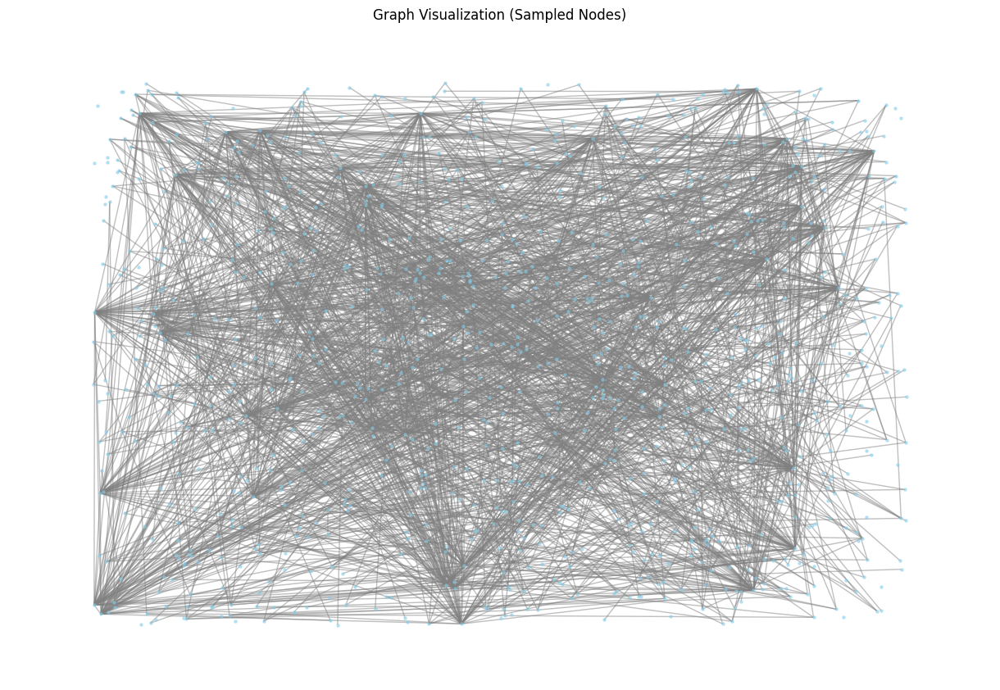

CPU times: total: 281 ms
Wall time: 510 ms


In [68]:
%%time
# Subgraph
sampled_nodes = random.sample(list(G.nodes()), k=1000)
subgraph = G.subgraph(sampled_nodes)
pos = nx.random_layout(subgraph)

plt.figure(figsize=(12, 8))
nx.draw(subgraph, pos, with_labels=False, node_size=5, node_color='skyblue', edge_color='gray', alpha=0.5)
plt.title('Graph Visualization (Sampled Nodes)')
plt.show()

## 3.2 Degree Centrality

We computed the degree centrality of this graph to check the distribution of degrees.

<Axes: >

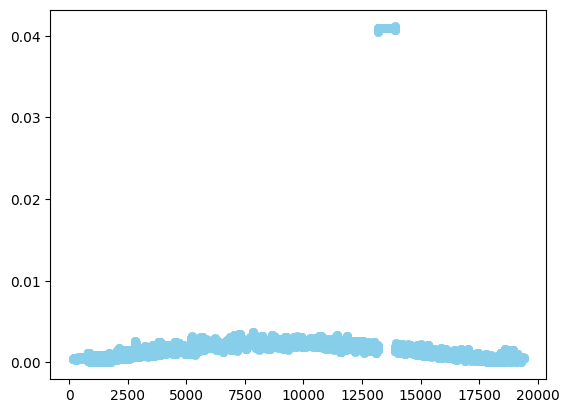

In [15]:
degree_centrality_g = nx.degree_centrality(G)
sns.scatterplot(data=degree_centrality_g, x=degree_centrality_g.keys(), y=degree_centrality_g.values(), color='skyblue', edgecolors='skyblue')

We can see from this distribution that most of the nodes have a small degree and there are only very few nodes which have a degree that is 4 times higher. For community detection, this could mean that a lot of the nodes will be disconnected and that we will rather have many small  and disconnected communities, rather than strongly connected ones.

## 3.3 K-Means

We use the KMeans clustering algorithm to categorize and visualize posts according to their sentiment and popularity. The x-axis represents the score of each post, indicating its popularity, while the y-axis depicts the sentiment score of the post. This approach allows us to delineate three distinct clusters: posts that are popular with neutral sentiment, posts that exhibit positive sentiment but are not highly popular, and posts that demonstrate negative sentiment but are also not highly popular.

In [16]:
def k_means_clustering(num_clusters, df, scaler):
    if not scaler:
        scaler = StandardScaler()

    filtered_df = df[df['post_id'].isin(G.nodes())]
    features_scaled = scaler.fit_transform(filtered_df[['score', 'sentiment_score']])

    kmeans = KMeans(n_clusters=num_clusters, random_state=0)
    filtered_df['cluster'] = kmeans.fit_predict(features_scaled)

    plt.figure(figsize=(10, 6))
    plt.scatter(filtered_df['score'], filtered_df['sentiment_score'], c=filtered_df['cluster'], cmap='viridis', alpha=0.5)
    plt.title('Clusters of Posts')
    plt.xlabel('Score')
    plt.ylabel('Sentiment Score')
    plt.colorbar(label='Cluster')
    plt.show()

c:\Users\kutir\anaconda3\envs\SMA\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\kutir\AppData\Local\Temp\ipykernel_30656\860664923.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['cluster'] = kmeans.fit_predict(features_scaled)


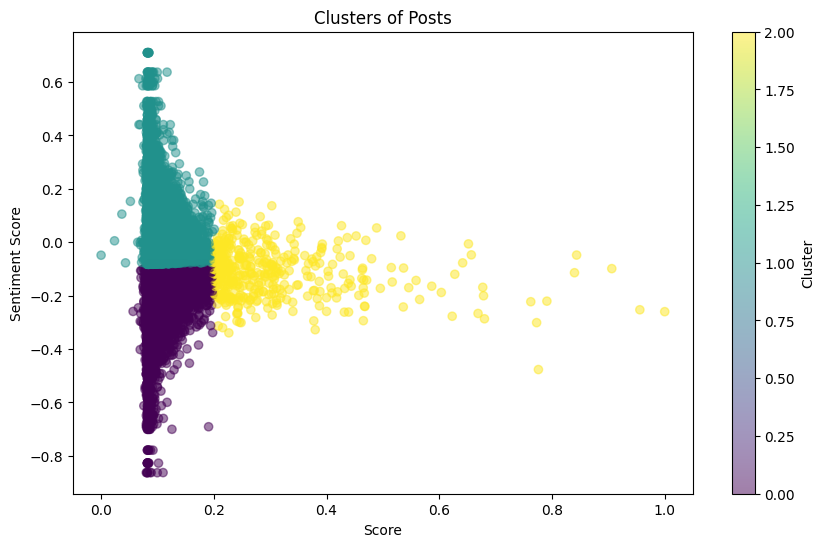

In [17]:
k_means_clustering(num_clusters=3, df=df_sorted, scaler=StandardScaler())

# 4. Network Analytics

For the analytics part of the project, we first implemented our own version of the Louvain community detection algorithm and analyzed its runtime and the community quality it gave us. We then further compared it to other community detection algorithms by measuring selected metrics. Finally, we computed a few centrality measures on the hypergraph of communities and we visualized the overall sentiment using wordclouds.

## 4.1 Louvain Implementation

The community detection algorithm we decided to implement for our project is the Louvain algorithm seen in class. After doing some research, we heavily based our code on the **"GVE-Louvain"** article by Ghosh, S., et al. (2023), which is one of the fastest and mos optimized implementations of Louvain existing today.  
_(GVE-Louvain: Fast Louvain Algorithm for Community Detection in Shared Memory Setting. Retrieved from [arXiv](https://arxiv.org/html/2312.04876v4))_

The first_phase function optimizes the modularity by moving nodes between communities, and the second_phase function aggregates the communities into a new, smaller graph. This process repeats either until no further modularity gain is possible, or until the number of iterations for the first phase has reached a predefined number of max_iterations to avoid entering an infinite loop.

The more iterations the alogrithm does, the more the communities will be converging with respect to the modularity, resulting in what we think is the most correctness. However, choosing too many iterations also makes the algorithm linearly slower as we will see a bit further down. Therefore, we needed to find a way to choose the right the tradeoff between correctness and time efficiency for our particular graph.  
This is the reason why we added a the parameter max_iterations to the louvain_community_detection function, in order to be able to play with that value later on. For simplification reasons, we set the default value of the number of iterations to 1.

In [18]:
def louvain_community_detection(G, max_iterations=1):
    def modularity_gain(G, node, community, total_weight, node2com, com2nodes, internal_weight, community_weight):
        k_i = G.degree(node, weight='weight')
        sum_in_community = community_weight[community]
        k_i_in = sum(G[node][neighbor]['weight'] for neighbor in com2nodes[community] if G.has_edge(node, neighbor))

        delta_q = (k_i_in - k_i * sum_in_community / total_weight) / total_weight
        return delta_q

    def first_phase(G, node2com, com2nodes, community_weight):
        total_weight = sum(attr['weight'] for u, v, attr in G.edges(data=True))
        internal_weight = {node: defaultdict(int) for node in G.nodes()}

        improvement = True
        iteration = 0
        
        while improvement:
            improvement = False
            for node in G.nodes():
                current_com = node2com[node]
                best_com = current_com
                best_gain = 0

                # Calculate gain for current community removal
                for neighbor in G[node]:
                    neighbor_com = node2com[neighbor]
                    if neighbor_com == current_com:
                        continue
                    gain = modularity_gain(G, node, neighbor_com, total_weight, node2com, com2nodes, internal_weight, community_weight)
                    if gain > best_gain:
                        best_gain = gain
                        best_com = neighbor_com

                if best_com != current_com:
                    com2nodes[current_com].remove(node)
                    if not com2nodes[current_com]:
                        del com2nodes[current_com]
                    node2com[node] = best_com
                    if best_com in com2nodes:
                        com2nodes[best_com].add(node)
                    else:
                        com2nodes[best_com] = {node}
                    community_weight[current_com] -= G.degree(node, weight='weight')
                    community_weight[best_com] += G.degree(node, weight='weight')
                    improvement = True

            iteration += 1
            if iteration > max_iterations:
                break

        return node2com, com2nodes, community_weight

    def second_phase(G, node2com, com2nodes):
        new_graph = nx.Graph()
        weights = defaultdict(float)

        for com, nodes in com2nodes.items():
            new_graph.add_node(com)
            for u, v in itertools.combinations(nodes, 2):
                if G.has_edge(u, v):
                    weight = G[u][v]['weight']
                    weights[(com, com)] += weight

        for (com1, com2), weight in weights.items():
            if com1 == com2:
                new_graph.add_edge(com1, com2, weight=weight / 2.0)
            else:
                new_graph.add_edge(com1, com2, weight=weight)

        return new_graph

    node2com = {node: node for node in G.nodes()}
    com2nodes = {node: {node} for node in G.nodes()}
    community_weight = {node: G.degree(node, weight='weight') for node in G.nodes()}

    current_graph = G
    iteration = 0
    while True:
        node2com, com2nodes, community_weight = first_phase(current_graph, node2com, com2nodes, community_weight)
        #com2nodes is partition of 1st graph
        new_graph = second_phase(current_graph, node2com, com2nodes)
        if len(new_graph.nodes()) == len(current_graph.nodes()):
            break
        current_graph = new_graph
        community_weight = {node: current_graph.degree(node, weight='weight') for node in current_graph.nodes()}
        iteration += 1

    final_partition = defaultdict(set)
    for node, community in node2com.items():
        final_partition[community].add(node)

    return list(dict(final_partition).values())

## 4.2 Visualization Functions

We implemented a few helper functions to visualize the graph with its different communities. For this, we implemented three functions:

- draw_communities(): Draws the entire graph and colors the nodes differently according to their community. The edge weights are also visualized, erg edges with higher weights are more opaque than edges with small weight.

- create hypergraph(): Creates a hypergraph where each node in the hypergraph represents a community in the old graph. The size of the node is proprtional to the size of the community and each node has its size as label. The edge weights are also kept.

- draw_hypergraph(): Draws the hypergraph constructed above.

In [19]:
def draw_communities_nx(G, communities):
    supergraph = nx.cycle_graph(len(communities))
    superpos = nx.spring_layout(supergraph, scale=50, seed=429)

    centers = list(superpos.values())
    pos = {}
    for center, comm in zip(centers, communities):
        pos.update(nx.spring_layout(nx.subgraph(G, comm), center=center, seed=1430))
        
    plt.figure(figsize=(20, 15))
    color_map = plt.get_cmap('tab10')
    for idx, community in enumerate(communities):
        nx.draw_networkx_nodes(G, pos=pos, nodelist=community, node_color=[color_map(idx)], node_size=100, alpha=0.9)
    
    edges = G.edges(data=True)
    weights = [data['weight'] for _, _, data in edges]
    max_weight = max(weights)
    min_weight = min(weights)
    normalized_weights = [(weight - min_weight) / (max_weight - min_weight) for weight in weights]
    edge_colors = [(0, 0, 0, alpha) for alpha in normalized_weights]  # RGBA color with varying alpha

    nx.draw_networkx_edges(G, pos=pos, edge_color=edge_colors, width=0.3)
    
    plt.title("Graph and its Communities")
    plt.tight_layout()
    plt.show()

In [20]:
def create_hypergraph(G, communities, min=2):
    H = nx.Graph()
    for i, community in enumerate(communities):
        size = len(community)
        if size >= min:
            H.add_node(i, size=size, label=size)
    
    for i, comm1 in enumerate(communities):
        if len(comm1) < min:
            continue
        for j, comm2 in enumerate(communities):
            if i < j and len(comm2) >= min:
                weight = 0
                for node1 in comm1:
                    for node2 in comm2:
                        if G.has_edge(node1, node2):
                            weight += G[node1][node2]['weight']
                if weight > 0:
                    H.add_edge(i, j, weight=weight)

    return H

In [21]:
def draw_hypergraph(H, node_scale=20):
    pos = nx.spring_layout(H)
    plt.figure(figsize=(20, 15))
    
    sizes = [H.nodes[node]['size'] * node_scale for node in H.nodes()]  # Scale node sizes
    labels = {node: H.nodes[node]['label'] for node in H.nodes()}
    
    nx.draw(H, pos, node_size=sizes, labels=labels, with_labels=True, node_color='skyblue', alpha=0.8)
    
    edges = H.edges(data=True)
    weights = [data['weight'] for _, _, data in edges]
    max_weight = max(weights) if weights else 1
    min_weight = min(weights) if weights else 0
    normalized_weights = [(weight - min_weight) / (max_weight - min_weight) for weight in weights]
    edge_colors = [(0, 0, 0, alpha) for alpha in normalized_weights]  # RGBA color with varying alpha
    
    nx.draw_networkx_edges(H, pos, edge_color=edge_colors, width=0.05)
    
    plt.title("Hypergraph of Communities")
    plt.show()

## 4.3. Finding the right parameters

### 4.3.1 Execution Time 

To test all of the functions defined above, we wrote a small function which generates a random weighted graph of a selected number of nodes and edges. This function is not further relevant for the project, it only served for testing purposes.

We then tried to test and analyze the correcness of our louvain implementation. First, by trying to figure out what impact the number of iteration has on the execution time of the algorithm. To do that, we first create 20 random graphs of increasing size, and apply our implementation of louvain to it, varying the number of iterations. We then plot the execution times and compare the result of our algorithm networkx implementation of louvain.

To do this easily, we define a helper function plot_execution_time(), which takes the maximum number of iterations for our algorithm as parameter.

In [22]:
def generate_random_weighted_graph(num_nodes, num_edges):
    G = nx.Graph()

    G.add_nodes_from(range(num_nodes))

    edges = []
    for _ in range(num_edges):
        node1 = random.randint(0, num_nodes - 1)
        node2 = random.randint(0, num_nodes - 1)
        weight = random.uniform(0.1, 1.0)  # Random weight between 0.1 and 1.0
        if node1 != node2 and (node1, node2) not in edges and (node2, node1) not in edges:
            edges.append((node1, node2, weight))
    
    G.add_weighted_edges_from(edges)
    return G

In [23]:
def plot_execution_time(max_iterations):
    num_graphs = 20
    start_nodes = 100
    start_edges = 500
    nodes_step = 100
    edges_step = 500
    
    times_a1 = []
    times_a2 = []
    for i in range(num_graphs):
        num_nodes = start_nodes + i * nodes_step
        num_edges = start_edges + i * edges_step
        rwg = generate_random_weighted_graph(num_nodes, num_edges)
        
        time_a1 = timeit.timeit(lambda: louvain_community_detection(rwg, max_iterations), number=1)
        time_a2 = timeit.timeit(lambda: nx.community.louvain_communities(rwg), number=1)
        
        times_a1.append(time_a1)
        times_a2.append(time_a2)
    
    print(times_a1[-1])
    print(times_a2[-1])
    dataset_sizes = np.arange(1, 21)
    
    def linear_func(x, a, b):
        return a * x + b
    
    popt1, pcov1 = curve_fit(linear_func, dataset_sizes, times_a1)
    popt2, pcov2 = curve_fit(linear_func, dataset_sizes, times_a2)
    
    plt.plot(dataset_sizes, linear_func(dataset_sizes, *popt1), 'r--', label='Ours')
    plt.plot(dataset_sizes, linear_func(dataset_sizes, *popt2), 'b--', label='NetworkX')
    plt.xlabel('Dataset Size')
    plt.ylabel('Execution Time (s)')
    plt.title('Execution Time vs. Dataset Size')
    plt.legend()
    plt.show()
    
    print("Growth factor for Algorithm 1:", popt1[0])
    print("Growth factor for Algorithm 2:", popt2[0])
    
    if popt1[0] < popt2[0]:
        print(f"Our implementation is faster by a factor of {popt2[0]/popt1[0]} compared to NetworkX implementation")
    else:
        print(f"NetworkX implementation is faster by a factor of {popt1[0]/popt2[0]} compared to our implementation")

0.22529749991372228
0.3073428999632597


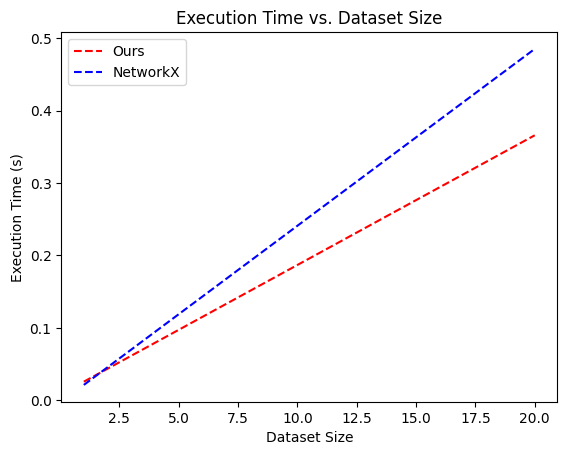

Growth factor for Algorithm 1: 0.017913444958851943
Growth factor for Algorithm 2: 0.024428302706437144
Our implementation is faster by a factor of 1.3636853638454327 compared to NetworkX implementation


In [24]:
#15s
plot_execution_time(1)

0.7593506000703201
0.47169070004019886


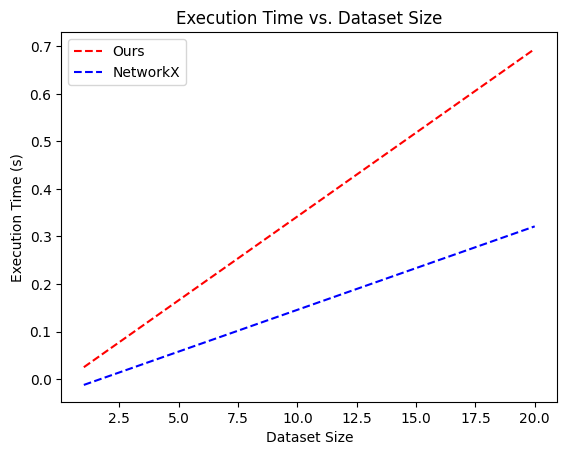

Growth factor for Algorithm 1: 0.035251577966843084
Growth factor for Algorithm 2: 0.017561339850659885
NetworkX implementation is faster by a factor of 2.007339887879823 compared to our implementation


In [25]:
#20s
plot_execution_time(5)

1.5525756999850273
0.3795576000120491


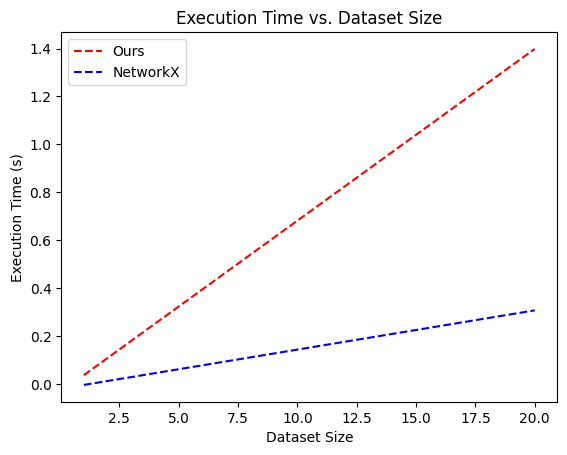

Growth factor for Algorithm 1: 0.07167915405854952
Growth factor for Algorithm 2: 0.016383244308753618
NetworkX implementation is faster by a factor of 4.3751501660907985 compared to our implementation


In [26]:
#30s
plot_execution_time(10)

2.5937109000515193
0.3956226999871433


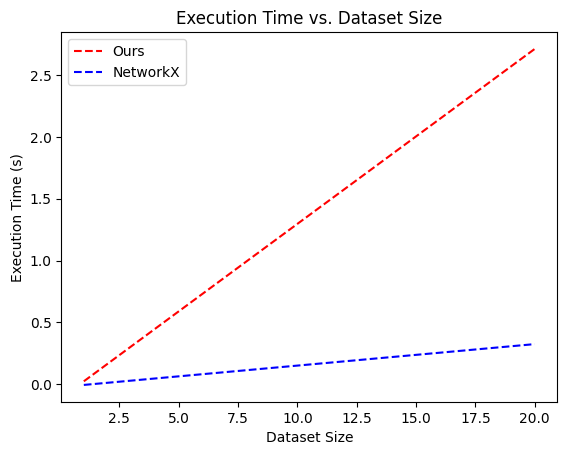

Growth factor for Algorithm 1: 0.14144534864126834
Growth factor for Algorithm 2: 0.017366919622588482
NetworkX implementation is faster by a factor of 8.144527165156902 compared to our implementation


In [27]:
#40s
plot_execution_time(20)

9.00480290001724
0.5076233999570832


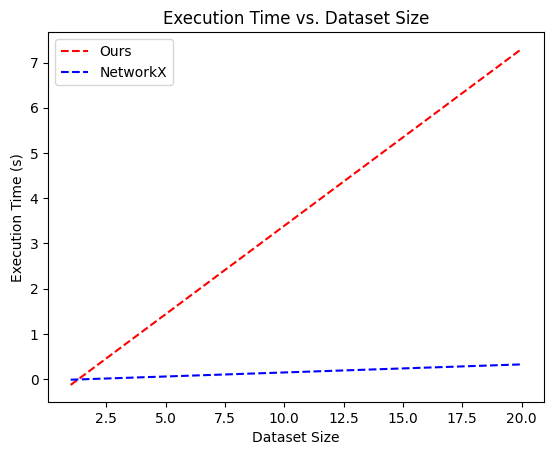

Growth factor for Algorithm 1: 0.3912231977710894
Growth factor for Algorithm 2: 0.017846954692819435
NetworkX implementation is faster by a factor of 21.921005824511596 compared to our implementation


In [28]:
#1min 30s
plot_execution_time(50)

14.551556999911554
0.27944810001645237


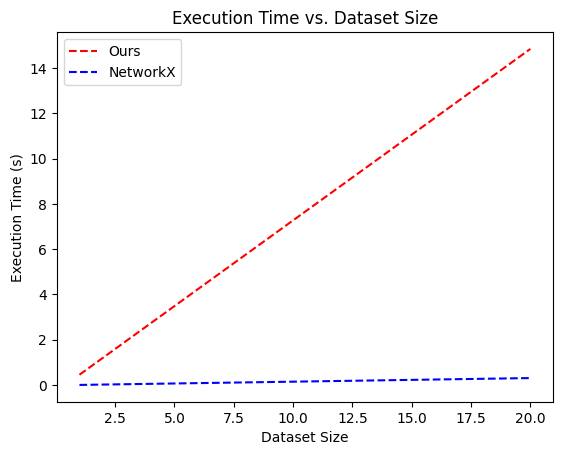

Growth factor for Algorithm 1: 0.7577000460878884
Growth factor for Algorithm 2: 0.015947498492780765
NetworkX implementation is faster by a factor of 47.51215662010502 compared to our implementation


In [29]:
#3min 15s
plot_execution_time(100)

|  | Our Louvain | NetworkX Louvain |
| --- | --- | --- |
| Runtime - 1 iter | **0.23**  | 0.288 | 
| Runtime - 5 iter | 0.761 | **0.227** | 
| Runtime - 10 iter | 1.368 | **0.252** | 
| Runtime - 20 iter | 2.782 | **0.251** | 
| Runtime - 50 iter | 7.455 | **0.241** |
| Runtime - 100 iter | 16.538 | **0.269** |  

We can clearly see that the execution time increases proportionally to number of iterations the algorithm makes. When doing only one iteration, our implementation of Louvain is as fast as the networkx implementation, even a bit faster.

We want to further analyze the quality of the communities depending on the number of iterations we choose for our implementation.

### 4.3.2 Community Quality

For further analysis, generate three different random graphs of different sizes (50, 100), (500, 1000) and (5000, 10000). For each of the graphs we do the following:

1. Detect the communities generated by our implementation of Louvain with 1, 5, 10 and 20 iterations. We stop at 20 iterations because anything more than that would be too time-inefficient for an implementation on a bigger graph.
2. Detect the communities generated by the networkx implementation of Louvain
3. Compare the number of communities generated, the biggest and the smallest community size
4. Calculate NMI (Normalized Mutual Information) for each set of communities and compare
5. Calculate the Max Modularity for each set of communities and compare
6. Visualize the communities created by running our implentation with 5 iterations and the communities created by networkx.
7. Visualize both hyptergraphs.

For this, we also created a helper function which is called community_comparison(). It takes the graph, the list of iterations, (1, 5, 10, 20) in our case, and a variable "min" as arguments. "min" defines the minimal size the communities need to have in order to be displayed. We do this to avoid drawing too many single communities, aiming to visualize the biggest few connected components.

In [30]:
def normalized_mutual_info(graph, c1, c2):
    node_to_community1 = {node: i for i, community in enumerate(c1) for node in community}
    labels1 = [node_to_community1[node] for node in graph.nodes()]
        
    node_to_community2 = {node: i for i, community in enumerate(c2) for node in community}
    labels2 = [node_to_community2[node] for node in graph.nodes()]

    return normalized_mutual_info_score(labels1, labels2)

In [31]:
def compare_louvain_communities(graph, iterations):
    community_results = []
    nmi_results = []
    
    for it in iterations:
        communities_custom = louvain_community_detection(graph, it)
        communities_networkx = nx.community.louvain_communities(graph, weight='weight')
        
        num_communities_custom = len(communities_custom)
        sizes_custom = [len(c) for c in communities_custom]
        
        largest_custom = max(sizes_custom)
        smallest_custom = min(sizes_custom)
        
        nmi = normalized_mutual_info(graph, communities_custom, communities_networkx)
        
        modularity_custom = nx.algorithms.community.quality.modularity(graph, communities_custom, weight='weight')
        
        community_results.append({
            'implementation': f'custom, {it} it.',
            'num_communities': num_communities_custom,
            'largest': largest_custom,
            'smallest': smallest_custom,
            'modularity': modularity_custom
        })
        
        nmi_results.append({
            'max_iterations': it,
            'nmi with nx_louvain': nmi
        })
    
    # NetworkX Louvain results
    num_communities_networkx = len(communities_networkx)
    sizes_networkx = [len(c) for c in communities_networkx]
    largest_networkx = max(sizes_networkx)
    smallest_networkx = min(sizes_networkx)
    modularity_networkx = nx.algorithms.community.quality.modularity(graph, communities_networkx, weight='weight')
    
    community_results.append({
        'implementation': 'networkx',
        'num_communities': num_communities_networkx,
        'largest': largest_networkx,
        'smallest': smallest_networkx,
        'modularity': modularity_networkx
    })
    
    return community_results, nmi_results

In [32]:
def visualize_test(graph, min):
    nxc = nx.community.louvain_communities(graph)
    c = louvain_community_detection(graph, 5)

    print("Communities detected by our Louvain implementation")
    draw_communities_nx(graph, c)

    print("Communities detected by networkx Louvain implementation")
    draw_communities_nx(graph, nxc)

    print("Hypergraph of Communities detected by our Louvain implementation")
    H1 = create_hypergraph(graph, c, min)
    draw_hypergraph(H1)
    
    print("Hypergraph of Communities detected by networkx Louvain implementation")
    H2 = create_hypergraph(graph, nxc, min)
    draw_hypergraph(H2)

In [33]:
rg1 = generate_random_weighted_graph(50, 100)
rg2 = generate_random_weighted_graph(500, 1000)
rg3 = generate_random_weighted_graph(5000, 10000)

iterations = [1, 5, 10, 20]

In [34]:
# Analyze each graph
community_results_rg1, nmi_results_rg1 = compare_louvain_communities(rg1, iterations)
community_results_rg2, nmi_results_rg2 = compare_louvain_communities(rg2, iterations)
community_results_rg3, nmi_results_rg3 = compare_louvain_communities(rg3, iterations)

# Display results using pandas
community_df_rg1 = pd.DataFrame(community_results_rg1)
community_df_rg2 = pd.DataFrame(community_results_rg2)
community_df_rg3 = pd.DataFrame(community_results_rg3)

nmi_df_rg1 = pd.DataFrame(nmi_results_rg1)
nmi_df_rg2 = pd.DataFrame(nmi_results_rg2)
nmi_df_rg3 = pd.DataFrame(nmi_results_rg3)

In [35]:
print("Results for RG1:")
community_df_rg1

Results for RG1:


,implementation,num_communities,largest,smallest,modularity
0,"custom, 1 it.",14,8,1,0.198265
1,"custom, 5 it.",10,7,1,0.362866
2,"custom, 10 it.",10,10,1,0.296302
3,"custom, 20 it.",9,11,1,0.278774
4,networkx,8,15,1,0.486440


In [36]:
print("NMI for RG1:")
nmi_df_rg1

NMI for RG1:


,max_iterations,nmi with nx_louvain
0,1,0.568646
1,5,0.653900
2,10,0.633791
3,20,0.544473


In [37]:
print("Results for RG2:")
community_df_rg2

Results for RG2:


,implementation,num_communities,largest,smallest,modularity
0,"custom, 1 it.",143,17,1,0.239637
1,"custom, 5 it.",76,18,1,0.255251
2,"custom, 10 it.",58,25,1,0.269808
3,"custom, 20 it.",48,30,1,0.275554
4,networkx,32,44,1,0.619899


In [38]:
print("NMI for RG2:")
nmi_df_rg2

NMI for RG2:


,max_iterations,nmi with nx_louvain
0,1,0.632522
1,5,0.544023
2,10,0.504378
3,20,0.485277


In [39]:
print("Results for RG3:")
community_df_rg3

Results for RG3:


,implementation,num_communities,largest,smallest,modularity
0,"custom, 1 it.",1320,21,1,0.232638
1,"custom, 5 it.",573,46,1,0.234664
2,"custom, 10 it.",371,67,1,0.238413
3,"custom, 20 it.",256,62,1,0.244773
4,networkx,135,164,1,0.656180


In [40]:
print("NMI for RG3:")
nmi_df_rg3

NMI for RG3:


,max_iterations,nmi with nx_louvain
0,1,0.624887
1,5,0.523208
2,10,0.459910
3,20,0.397267


For efficiency and space reasons, we commented the first and third line in the next paragraph. They can be uncommented if one wants to have a closer look at the community construction on graphs of different sizes.

Communities detected by our Louvain implementation


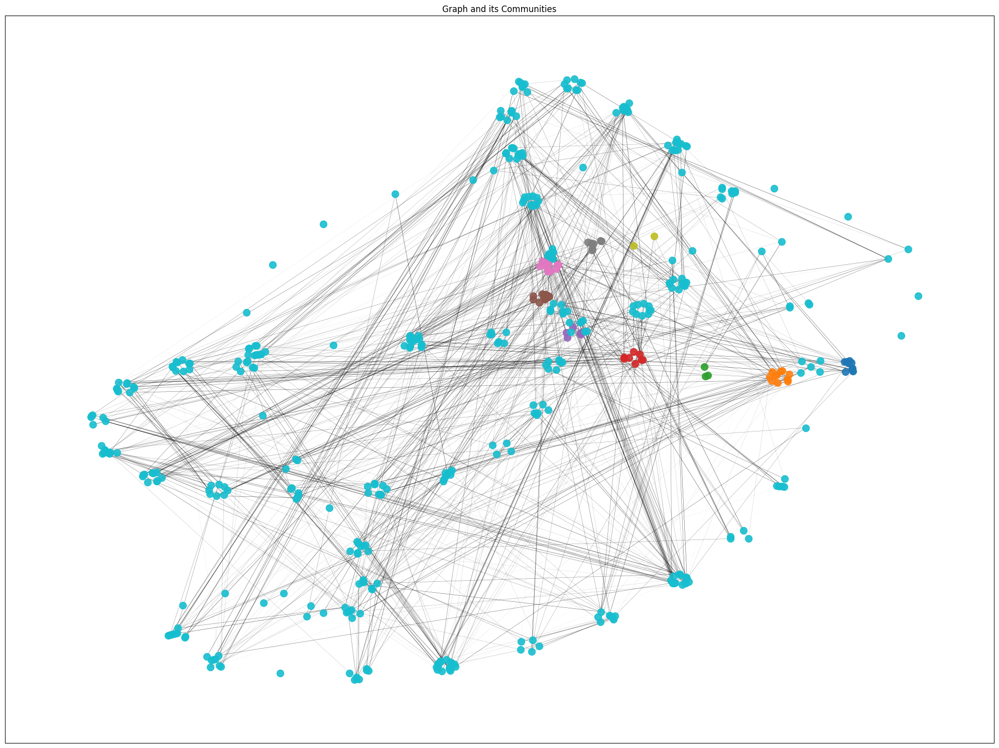

Communities detected by networkx Louvain implementation


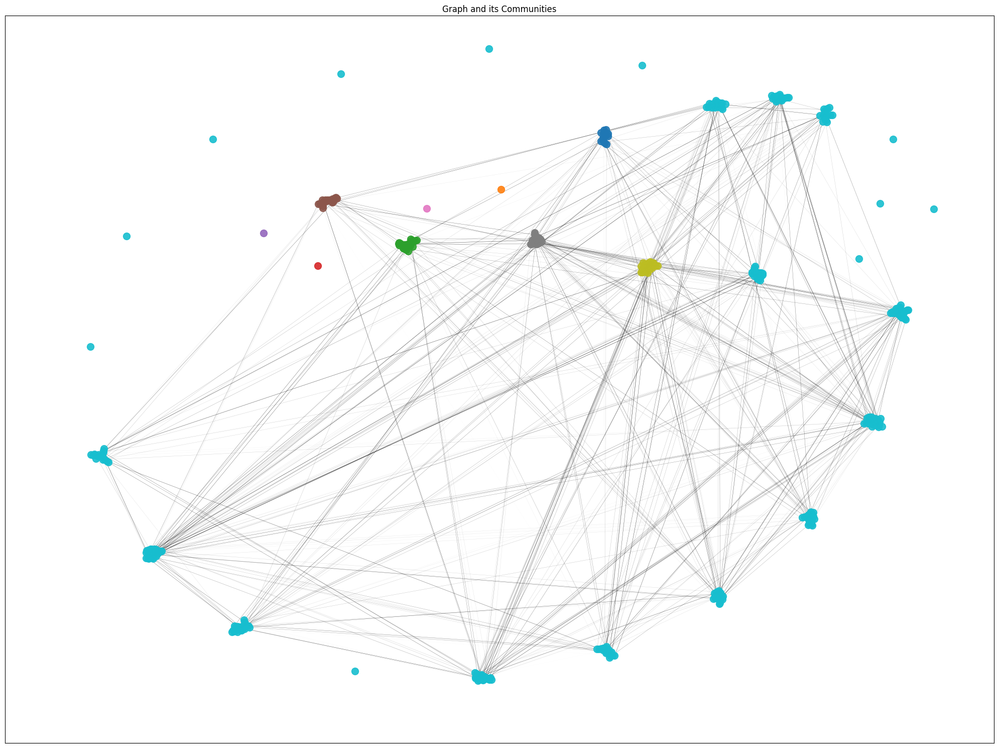

Hypergraph of Communities detected by our Louvain implementation


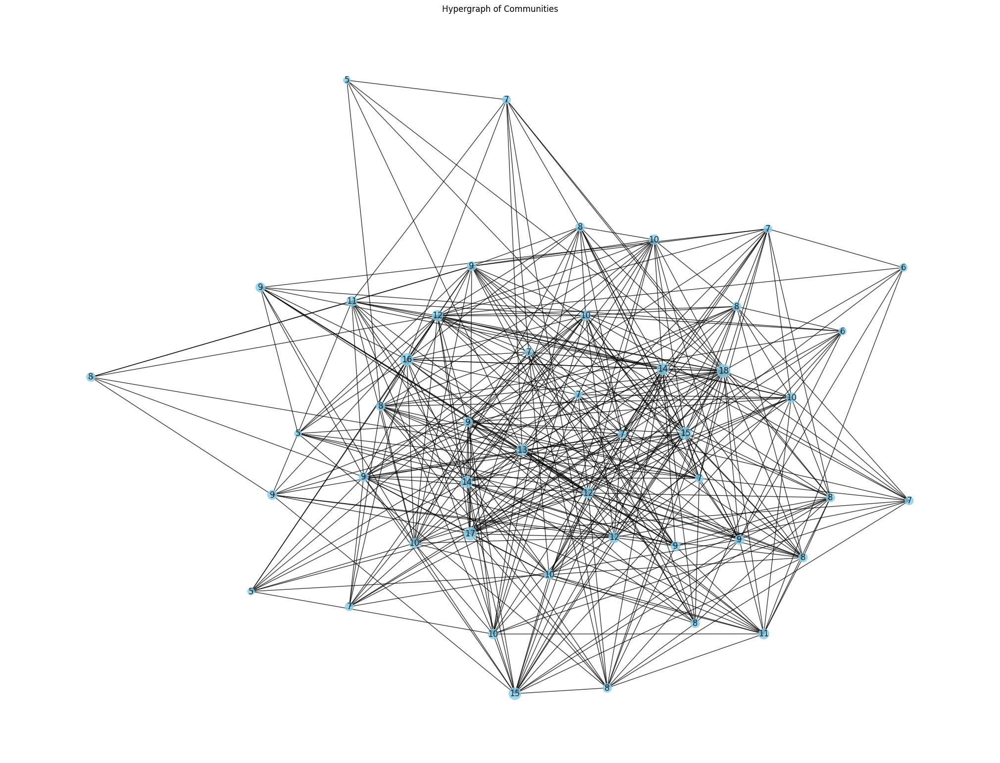

Hypergraph of Communities detected by networkx Louvain implementation


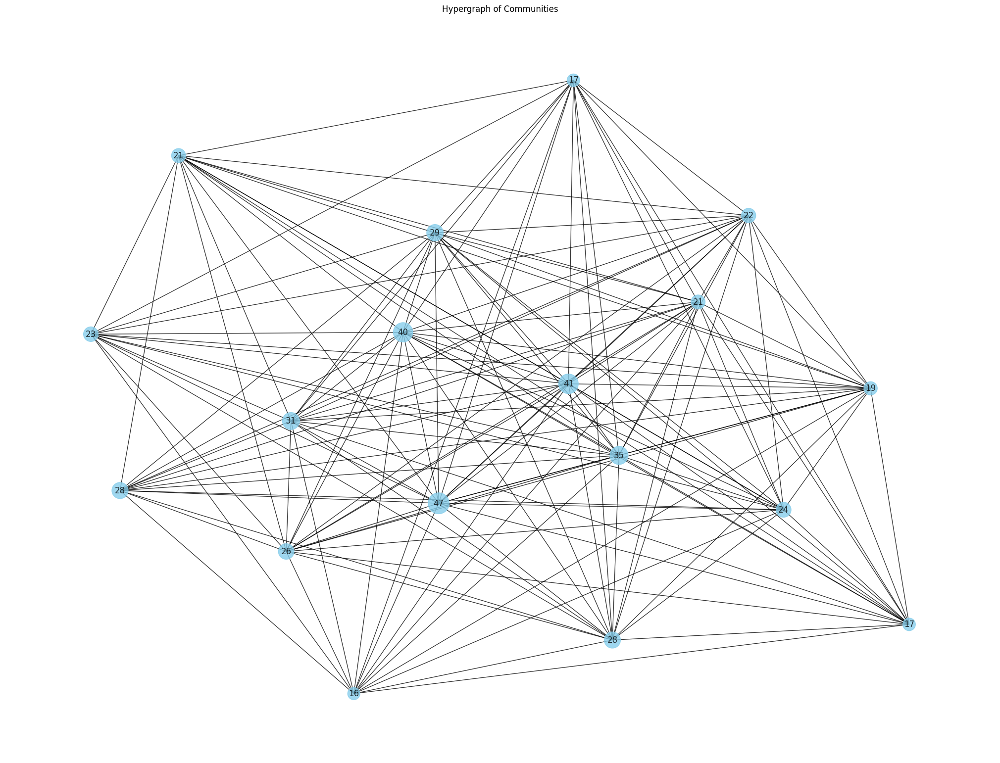

In [41]:
#visualize_test(rg1, 3)
visualize_test(rg2, 5)
#visualize_test(rg3, 10)

For all three graphs we can see similar results.

As the algorithm does more iterations, the number of communities decreases. Logically, the size of the largest community and also the modularity of the communities increase with the number of iterations. Generally, the networkx implementation has less but bigger communities than our implementation. Except for the first random graph, the modularity of the networkx louvain communities is also significantly higher, which indicates better clustering.

It is very interesting to see, however, how the NMI evolves with the number of iterations. For the second and third random graph the NMI is highest when performing only one iteration. This indicates that, despite the number and sizes of communities being very different, the implementation that performs only one iteration is the most similar one to the networkx one.

## 4.4 Community Detection

#### 4.4.1 Community Detection with Louvain

Finally, we want to test all of the above on our original graph which has 17'309 nodes and 493'728 edges.

We run our algorithm 3 times, varying the maximum number of iterations between 1, 5 and 10.  
We then take the 3 different community-partitions and compare them to the networkx communities using the NMI as above.

For efficiency reasons, also here, the implementation with 5 and 10 iterations are commented. One can uncomment those to have a deeper insight.

In [42]:
%%time
partition1 = louvain_community_detection(G, 1)
print(f"\nNumber of louvain communities: {len(partition1)}")
#approx 4min


Number of louvain communities: 334
CPU times: total: 4min 35s
Wall time: 7min 42s


In [43]:
#%%time
#partition5 = louvain_community_detection(G, 5)
#print(f"\nNumber of louvain communities: {len(partition5)}")
#approx 11min

In [44]:
#%%time
#partition10 = louvain_community_detection(G, 10)
#print(f"\nNumber of louvain communities: {len(partition10)}")
#approx 20min

In [45]:
%%time
nx_partition = nx.community.louvain_communities(G)
print(f"\nNumber of python louvain communities: {len(nx_partition)}")
#approx 4s


Number of python louvain communities: 203
CPU times: total: 4.23 s
Wall time: 6.26 s


In [46]:
nmi1 = normalized_mutual_info(G, partition1, nx_partition)
print(f"NMI for 1 iteration: {nmi1}")

#nmi5 = normalized_mutual_info(G, partition5, nx_partition)
#print(f"NMI for 5 iteration: {nmi5}")

#nmi10 = normalized_mutual_info(G, partition10, nx_partition)
#print(f"NMI for 10 iteration: {nmi10}")

NMI for 1 iteration: 0.7734382734530173


As we run the different implementations, we can see that the NMI stays practically the same, whether we increase the number of iterations or not. We can also see that the NMI is pretty high at roughly 0.77, which means that the communities detected are very similar to the ones detected by the networkx louvain. We can conclude that our implementation is good in terms of correctness and similarity to a predefined implementation, and by choosing one iteration of the 1st phase, we can even conclude that the algorithm is rather fast while running in less than 4 minutes on a graph of more than 17'000 nodes and 500'000 edges.

We finish off by visualizing the communities our algorithm found and the networkx communities.

Communities detected by our Louvain implementation


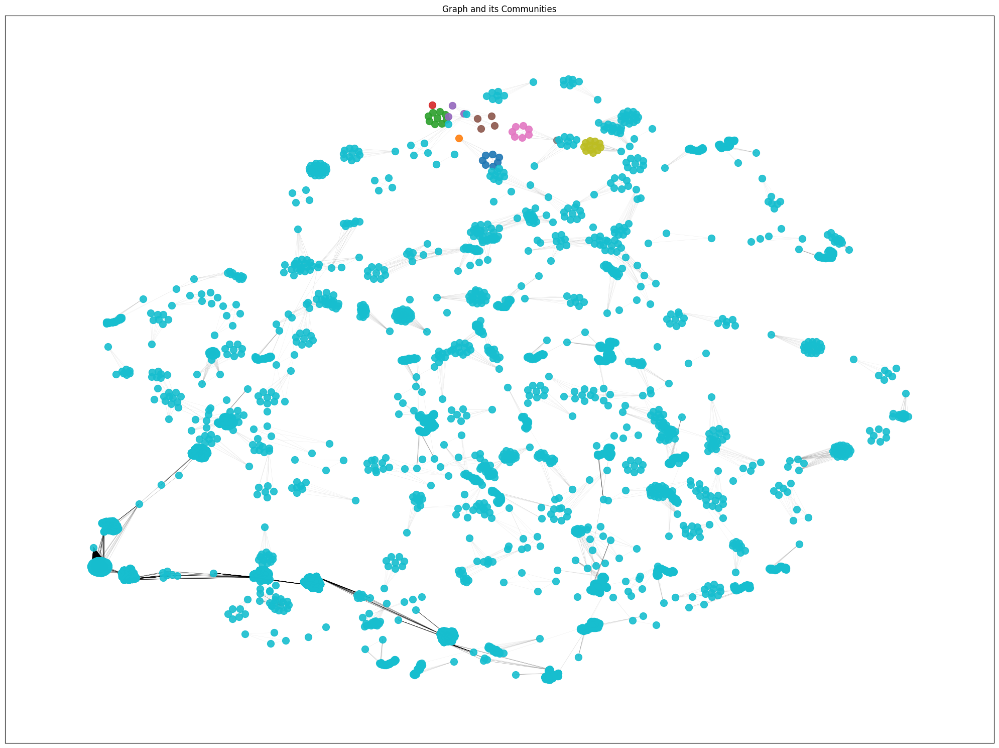

Hypergraph of Communities detected by our Louvain implementation


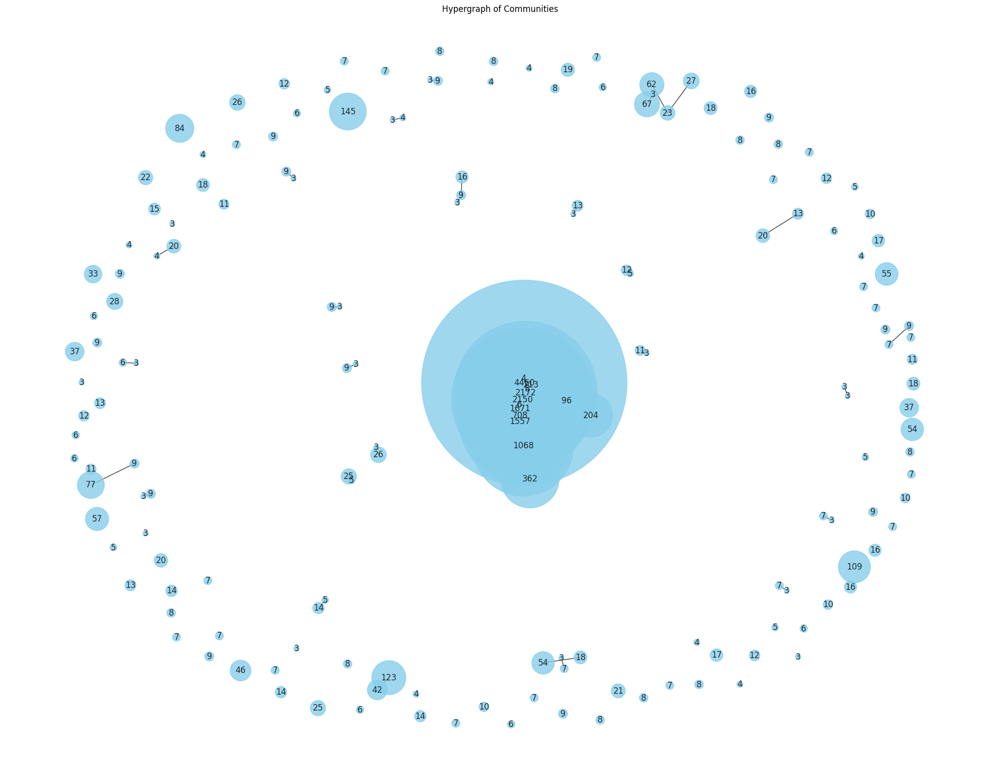

In [47]:
print("Communities detected by our Louvain implementation")
draw_communities_nx(G, partition1)

print("Hypergraph of Communities detected by our Louvain implementation")
H1 = create_hypergraph(G, partition1, min=3)
draw_hypergraph(H1)

Communities detected by networkx Louvain implementation


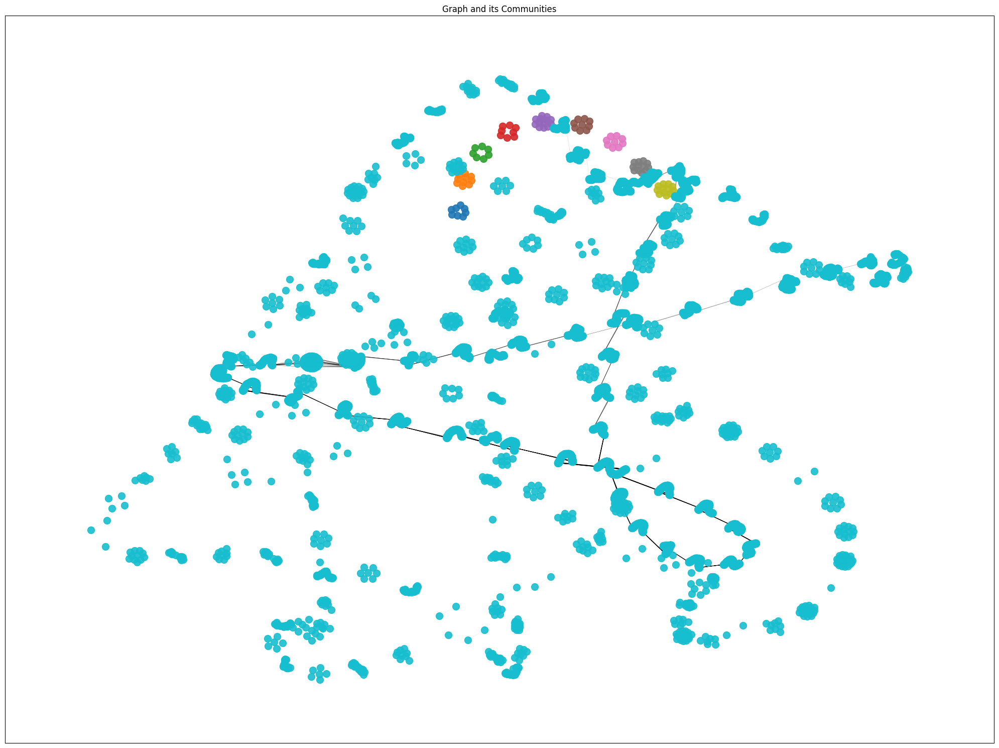

Hypergraph of Communities detected by networkx Louvain implementation


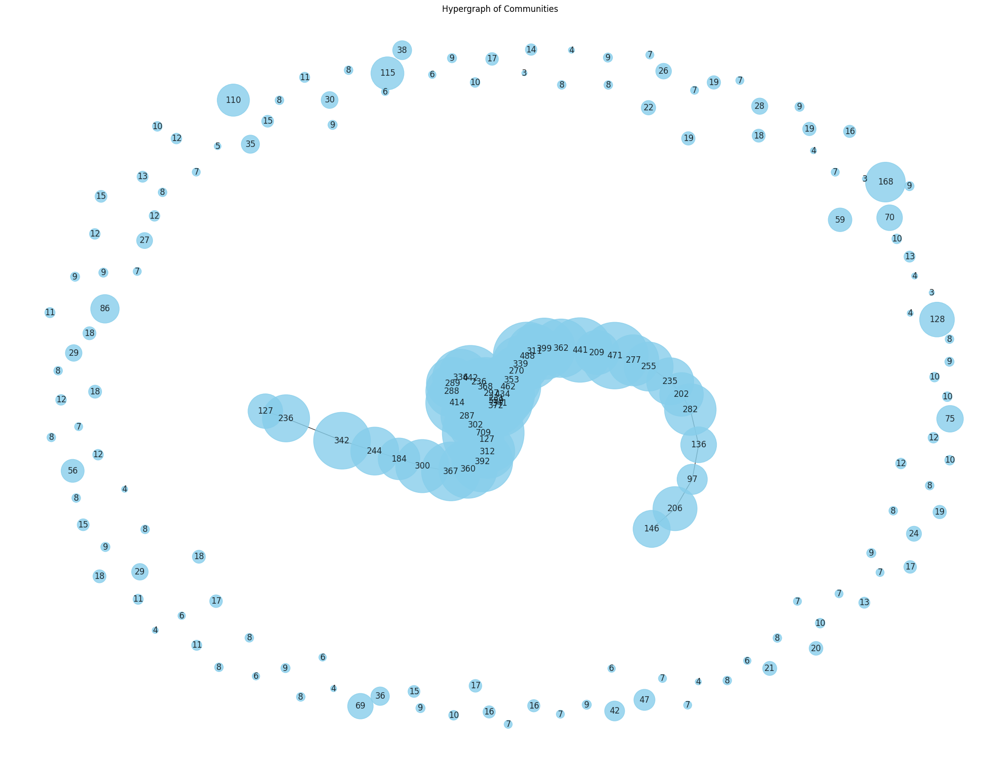

In [48]:
print("Communities detected by networkx Louvain implementation")
draw_communities_nx(G, nx_partition)

print("Hypergraph of Communities detected by networkx Louvain implementation")
H2 = create_hypergraph(G, nx_partition, min=3)
draw_hypergraph(H2)

### 4.4.2 Other community detection algorithms

To further analyze our social graph, we continue by running a few other community detection algorithms on our graph.

We decided to run the following community detection algorithms:

- **Label Propagation Algorithm (LPA):** An iterative algorithm that works by propagating labels through the network.
- **Greedy Modularity Communities:** Based on optimizing modularity.
  
We put each community in the same datastructure after computing, to facilitate calculating the metrics later on.

In [49]:
# LPA
lpa_partition = [set(community) for community in nx.algorithms.community.label_propagation_communities(G)]

In [50]:
# Greedy Modularity
gm_partition = [set(community) for community in nx.algorithms.community.greedy_modularity_communities(G)]

### 4.4.3 Comparing the communities

We will now compare these different communities. First, we will compute the following metrics for each community:

- **Max Modularity**: Measures the strength of the division of a network into communities.
- **Silhouette Score**: Measures how similar an object is to its own cluster compared to other clusters.
- **Coverage**: The fraction of the edges that fall within the detected communities.
- **Purity**: Keeps track of the maximum count of same-community neighbors for each community. It sums these maximum counts for all communities and normalizes by the total number of nodes in the graph.

Finally, we will calculate the **Normalized Mutual Information** between our louvain communities and all of the other communities defined above.

We defined our own function to calculate the coverage, and we adapted the silhouette score function to fit our datastructures.

In [51]:
def silhouette(G, communities):
    adj_matrix = nx.to_numpy_array(G)
    
    # Create a label array from the partition
    node_to_community = {}
    for i, community in enumerate(communities):
        for node in community:
            node_to_community[node] = i
    
    labels = np.array([node_to_community[node] for node in G.nodes()])
    return silhouette_score(adj_matrix, labels, metric='precomputed')

In [52]:
def coverage(G, communities):
    intra_community_edges = sum(len(G.subgraph(community).edges()) for community in communities)
    return intra_community_edges / G.number_of_edges()

In [53]:
def community_purity(G, partition):
    community_to_nodes = {}
    for i, community in enumerate(partition):
        community_to_nodes[i] = community
    
    purity = 0
    for community_nodes in community_to_nodes.values():
        max_overlap = 0
        for node in community_nodes:
            neighbors = list(G.neighbors(node))

            same_community_neighbors = sum(1 for neighbor in neighbors if neighbor in community_nodes)
            if same_community_neighbors > max_overlap:
                max_overlap = same_community_neighbors
        purity += max_overlap
    
    return purity / G.number_of_nodes()

In [54]:
other_algos = []
results_metrics = []
results_nmi = []

In [55]:
other_algos.append({
        'Implementation': 'Our Louvain',
        'Number of Communities': len(partition1),
        'Largest Community': max([len(c) for c in partition1]),
        'Smallest Community': min([len(c) for c in partition1])
    })
other_algos.append({
        'Implementation': 'NetworkX Louvain',
        'Number of Communities': len(nx_partition),
        'Largest Community': max([len(c) for c in nx_partition]),
        'Smallest Community': min([len(c) for c in nx_partition])
    })
other_algos.append({
        'Implementation': 'Label Propagation Algorithm',
        'Number of Communities': len(lpa_partition),
        'Largest Community': max([len(c) for c in lpa_partition]),
        'Smallest Community': min([len(c) for c in lpa_partition])
    })
other_algos.append({
        'Implementation': 'Greedy Modularity Communities',
        'Number of Communities': len(gm_partition),
        'Largest Community': max([len(c) for c in gm_partition]),
        'Smallest Community': min([len(c) for c in gm_partition])
    })

In [56]:
results_metrics.append({
    'Partition': "Louvain",
    'Modularity': nx.algorithms.community.modularity(G, partition1),
    'Silhouette Score': silhouette(G, partition1),
    'Coverage': coverage(G, partition1),
    'Purity': community_purity(G, partition1)
})
results_metrics.append({
    'Partition': "nx-Louvain",
    'Modularity': nx.algorithms.community.modularity(G, nx_partition),
    'Silhouette Score': silhouette(G, nx_partition),
    'Coverage': coverage(G, nx_partition),
    'Purity': community_purity(G, nx_partition)
})
results_metrics.append({
    'Partition': "Label Propagation Algorithm",
    'Modularity': nx.algorithms.community.modularity(G, lpa_partition),
    'Silhouette Score': silhouette(G, lpa_partition),
    'Coverage': coverage(G, lpa_partition),
    'Purity': community_purity(G, lpa_partition)
})
results_metrics.append({
    'Partition': "Greedy Modularity Communities",
    'Modularity': nx.algorithms.community.modularity(G, gm_partition),
    'Silhouette Score': silhouette(G, gm_partition),
    'Coverage': coverage(G, gm_partition),
    'Purity': community_purity(G, gm_partition)
})

In [57]:
results_nmi.append({
    'Partition': "nx-Louvain",
    'NMI': normalized_mutual_info(G, partition1, nx_partition)
})
results_nmi.append({
    'Partition': "Label Propagation Algorithm",
    'NMI': normalized_mutual_info(G, partition1, lpa_partition)
})
results_nmi.append({
    'Partition': "Greedy Modularity Communities",
    'NMI': normalized_mutual_info(G, partition1, gm_partition)
})

In [58]:
algos = pd.DataFrame(other_algos)
algos

,Implementation,Number of Communities,Largest Community,Smallest Community
0,Our Louvain,334,4460,1
1,NetworkX Louvain,203,709,1
2,Label Propagation Algorithm,675,712,1
3,Greedy Modularity Communities,163,8333,1


In [59]:
metrics = pd.DataFrame(results_metrics)
metrics

,Partition,Modularity,Silhouette Score,Coverage,Purity
0,Louvain,0.730484,-0.992374,0.993198,0.145762
1,nx-Louvain,0.778637,-0.999422,0.994732,0.232827
2,Label Propagation Algorithm,0.702259,-0.999422,0.920393,0.855913
3,Greedy Modularity Communities,0.656246,-0.999422,0.991033,0.131203


In [60]:
nmis = pd.DataFrame(results_nmi)
nmis

,Partition,NMI
0,nx-Louvain,0.773438
1,Label Propagation Algorithm,0.624259
2,Greedy Modularity Communities,0.823647


We can see that, in general, the modularity, which measures the strength of the division of a network into modules (communities), is rather high. The networkx implementation of Louvain has a slightly higher modularity value, which suggests that the community structures are lighly stronger than for our implementation.

All methods exhibit negative silhouette scores, indicating possible overlaps or misplacements in community assignments, with nx-Louvain and Greedy Modularity Communities being slightly less negative.  

For all algorithms, good coverage was found, implying that most internal community connections that could exist, do exist, indicating good internal connectivity.  

We expected the value of the purity to be this low for our graph, because a lot of our communities are very big and is easier to have high purity in smaller communities.

Finally, the NMI score is clearly highest for the Greedy Modularity Algorithm, which suggest that the communities formed by our implementation are most similar to the ones formed by this algorithm.

## 4.5 Network Exploration on Community Hypergraph

We now want to explore the hypergragh of communities from our louvain implementation. We will measure the
- **Degree Centrality**
- **Betweenness Centrality** and the 
- **Closeness Centrality**

### 4.5.1 Degree Centrality

The degree centrality measures how connected the nodes are to each other. In our graph, the nodes represent created posts, while the edges were created based on the sentiment score, which is the intensity expressed in a post, and weighted by their number of likes.

<Axes: >

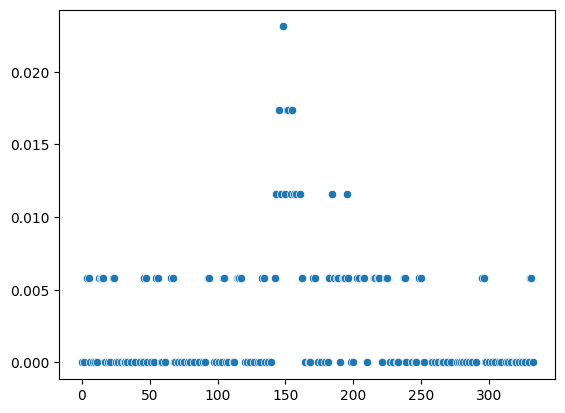

In [61]:
degree_centrality_h = nx.degree_centrality(H1)
sns.scatterplot(data=degree_centrality_h, x=degree_centrality_h.keys(), y=degree_centrality_h.values())

The plot reveals that the hypergraph has a few highly central communities with many connections, while most communities have relatively few connections. This can indicate the presence of hub-like structures within the network, where a few communities act as central nodes connecting many others, while the majority are more peripheral.

### 4.5.2 Betweenness centrality

The betweenness centrality of a node is a measure of how often that node appears on the shortest paths between any two other nodes in the graph. This measure indicates the importance of a node in facilitating connections between other nodes, making it a crucial point for the flow of information or resources in the graph.

<Axes: >

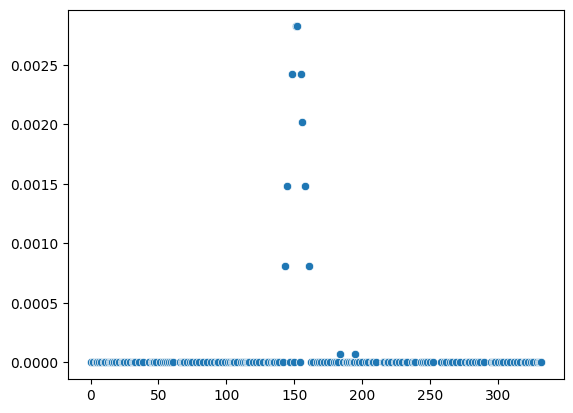

In [62]:
betweenness_centrality_h = nx.betweenness_centrality(H1)
sns.scatterplot(data=betweenness_centrality_h, x=betweenness_centrality_h.keys(), y=betweenness_centrality_h.values())

The plot reveals that the hypergraph has a few communities with high betweenness centrality, indicating they are key connectors within the network. However, the majority of communities have low betweenness centrality, suggesting that most do not play a significant bridging role. This can imply a network structure where a few communities are critical for maintaining overall connectivity, acting as essential bridges between other communities.

### 4.5.3 Closeness centrality

Closeness centrality is a measure of centrality that quantifies how close a node is to all other nodes in a network. It represents the average closeness of a node to all other nodes in the network by indicating how quickly a user can spread information or influence other users in the network.


<Axes: >

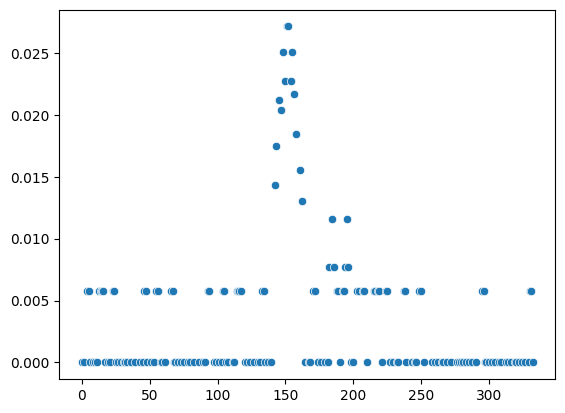

In [63]:
closeness_centrality_h = nx.closeness_centrality(H1)
sns.scatterplot(data=closeness_centrality_h, x=closeness_centrality_h.keys(), y=closeness_centrality_h.values())

The plot reveals that the hypergraph has a few communities with high closeness centrality, indicating they can quickly reach all other nodes. However, the majority of communities have low closeness centrality, suggesting that most are not centrally located and have longer average paths to other nodes. This can imply a network structure where a few well-connected communities facilitate efficient communication within the network, while most communities have less direct access to others.

## 4.6 Sentiment Analysis and Word clouds

As a final step for our analysis, we wanted to exploit the way we constructed our graph to perform sentiment analysis. We created 3 categories:

- **Negative** (sentiment score between -1 and -0.5)
- **Neutral** (sentiment score between -0.5 and 0.5)
- **Positive** (sentiment score between 0.5 and 1)

We then visualize word clouds for the most commonly used words and plot the distribution of number of comments per category in a bar chart.

In [64]:
def preprocess_text(text):
    stopwords = set(STOPWORDS)
    text = text.lower()
    text = ''.join([char for char in text if char not in string.punctuation])
    text = ' '.join([word for word in text.split() if word not in stopwords and len(word) > 1])
    return text

In [65]:
def generate_word_cloud(data, title):
    mask = np.array(Image.open("reddit.jpg"))
    wordcloud = WordCloud(
        max_words=800, 
        background_color='white', 
        mask=mask 
    ).generate(' '.join(data))
    image_colors = ImageColorGenerator(mask)
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()

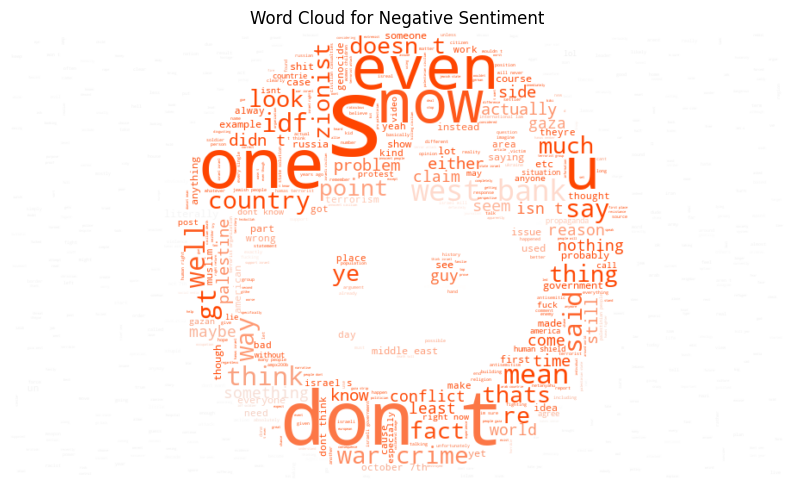

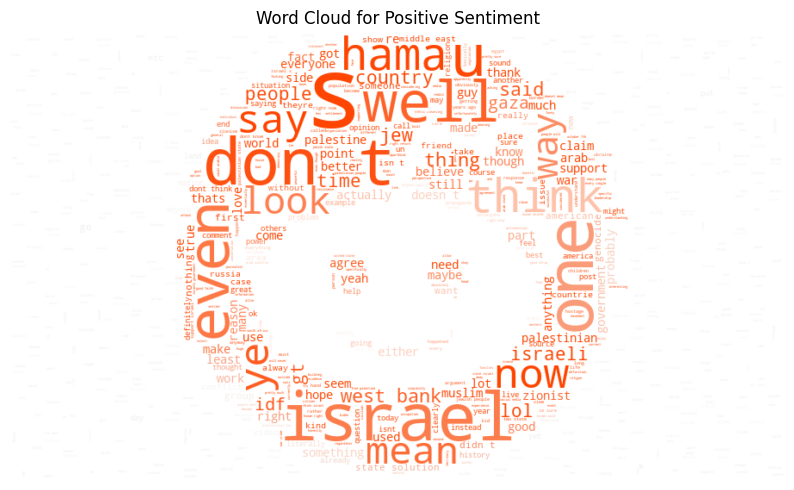

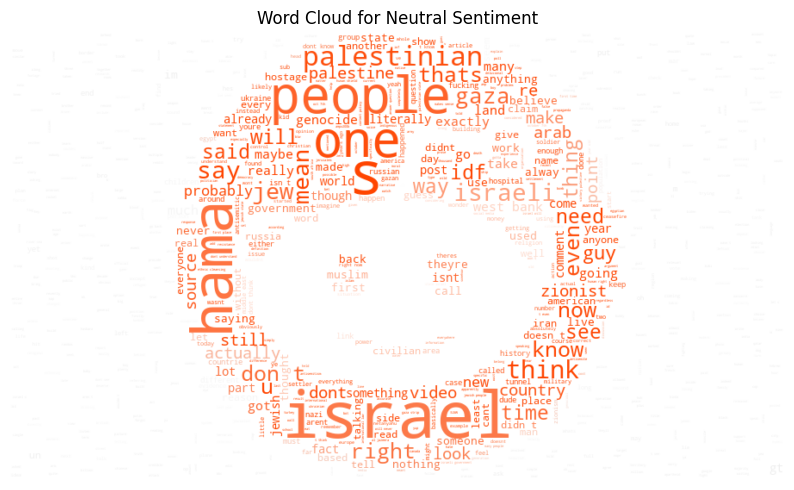

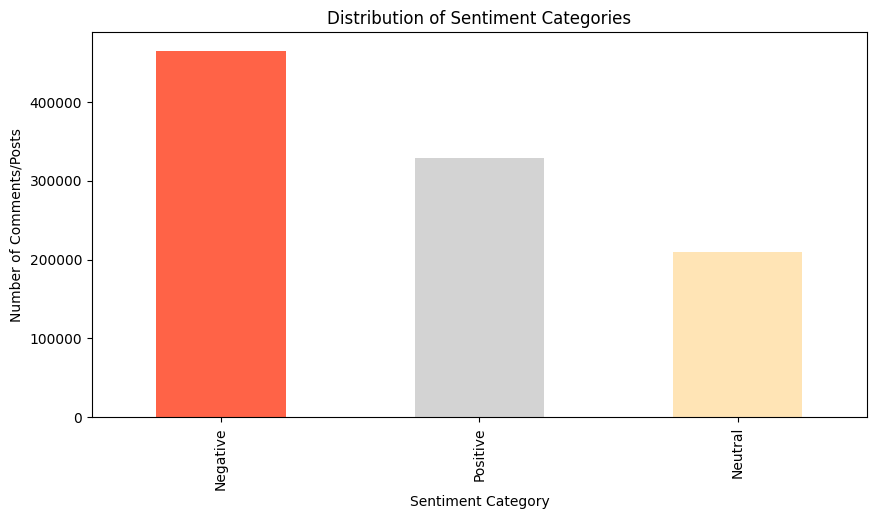

In [66]:
df_selected_features['cleaned_text'] = df_selected_features['self_text'].apply(preprocess_text)

# Categorize sentiment
df_selected_features['sentiment_category'] = pd.cut(df_selected_features['sentiment_score'], bins=[-1, -0.05, 0.05, 1], labels=['Negative', 'Neutral', 'Positive'])

# Word cloud for each sentiment category
for category in df_selected_features['sentiment_category'].unique():
    category_data = df_selected_features[df_selected_features['sentiment_category'] == category]['cleaned_text']
    generate_word_cloud(category_data, f'Word Cloud for {category} Sentiment')

# Distribution of sentiment
plt.figure(figsize=(10, 5))
df_selected_features['sentiment_category'].value_counts().plot(kind='bar', color=['tomato', 'lightgrey', 'moccasin'])
plt.title('Distribution of Sentiment Categories')
plt.xlabel('Sentiment Category')
plt.ylabel('Number of Comments/Posts')
plt.show()

As final interpretation we can see that the general sentiment within all of the reddit posts is generally negative.   
However, from the word clouds it's rather hard to detect distinct key words for each sentiment. The word "israel" is used more in positive and neutral contexts, and the word hamas is also used in rather neutral context.